## CS 445: Computational Photography

## Programming Project #3: Gradient Domain Fusion

In [1]:
# from google.colab import drive
# drive.mount('/content/drive')

In [2]:
%pip install scikit-image


Looking in indexes: https://pypi.org/simple, https://pypi.ngc.nvidia.com
Note: you may need to restart the kernel to use updated packages.


In [535]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import os
from random import random
import time
import scipy
import scipy.sparse.linalg

# modify to where you store your project data including utils.py
datadir = "C:/Users/tahaw/Downloads/cs445_proj3_starter_code-20250324T090027Z-001/cs445_proj3_starter_code/cs445_proj3_starter_code"


utilfn = datadir + "utils.py"

samplesfn = datadir + "samples"

import utils

In [536]:
import sys
print(sys.executable)


c:\Users\tahaw\ml-venv\Scripts\python.exe


## Part 1 Toy Problem (20 pts)

In [538]:
def toy_reconstruct(img):
    """
    The implementation for gradient domain processing is not complicated, but it is easy to make a mistake, so let's start with a toy example. Reconstruct this image from its gradient values, plus one pixel intensity. Denote the intensity of the source image at (x, y) as s(x,y) and the value to solve for as v(x,y). For each pixel, then, we have two objectives:
    1. minimize (v(x+1,y)-v(x,y) - (s(x+1,y)-s(x,y)))^2
    2. minimize (v(x,y+1)-v(x,y) - (s(x,y+1)-s(x,y)))^2
    Note that these could be solved while adding any constant value to v, so we will add one more objective:
    3. minimize (v(1,1)-s(1,1))^2

    :param toy_img: numpy.ndarray
    """

    # TO DO
    h, w = toy_img.shape
    num_pixels = h * w

    # Indexing function: maps (x, y) to a single index in the unknown vector
    def index(x, y):
        return y * w + x

    # Lists for constructing the sparse matrix
    row_idx, col_idx, values = [], [], []
    b = []

    equation_id = 0  # Keeps track of equation index

    # Constraints from gradients
    for y in range(h):
        for x in range(w):
            idx = index(x, y)

            # Horizontal gradient constraint
            if x < w - 1:  # Ensure we don't go out of bounds
                row_idx.append(equation_id)
                col_idx.append(idx)
                values.append(-1)

                row_idx.append(equation_id)
                col_idx.append(index(x + 1, y))
                values.append(1)

                b.append(toy_img[y, x + 1] - toy_img[y, x])
                equation_id += 1

            # Vertical gradient constraint
            if y < h - 1:
                row_idx.append(equation_id)
                col_idx.append(idx)
                values.append(-1)

                row_idx.append(equation_id)
                col_idx.append(index(x, y + 1))
                values.append(1)

                b.append(toy_img[y + 1, x] - toy_img[y, x])
                equation_id += 1

    # Reference pixel constraint (anchor at (0, 0))
    row_idx.append(equation_id)
    col_idx.append(index(0, 0))
    values.append(1)
    b.append(toy_img[0, 0])

    # Convert lists to arrays
    A_sparse = scipy.sparse.csr_matrix((values, (row_idx, col_idx)), shape=(len(b), num_pixels))
    b = np.array(b)

    # Solve Ax = b
    v = scipy.sparse.linalg.lsqr(A_sparse, b)[0]

    return v.reshape((h, w))

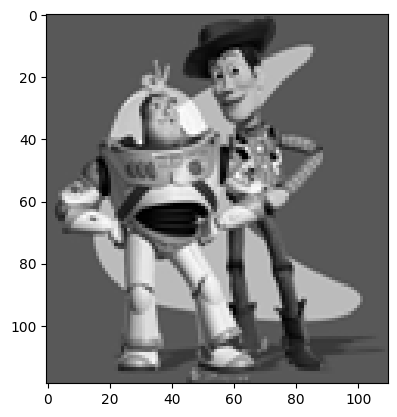

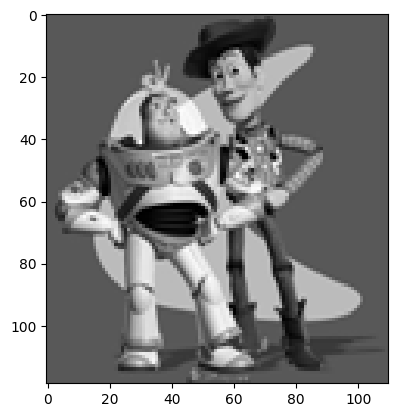

Max error is:  0.0010002051356842734


In [539]:
toy_img = cv2.cvtColor(cv2.imread('samples/samples/toy_problem.png'), cv2.COLOR_BGR2GRAY).astype('double') / 255.0
plt.imshow(toy_img, cmap="gray")
plt.show()

im_out = toy_reconstruct(toy_img)
plt.imshow(im_out, cmap="gray")
plt.show()
print("Max error is: ", np.sqrt(((im_out - toy_img)**2).max()))

## Preparation

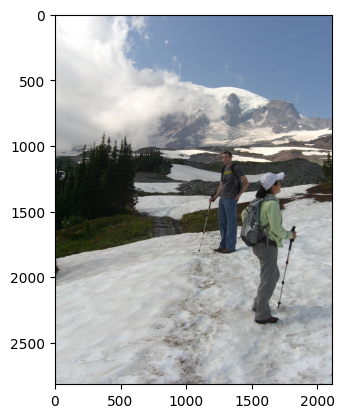

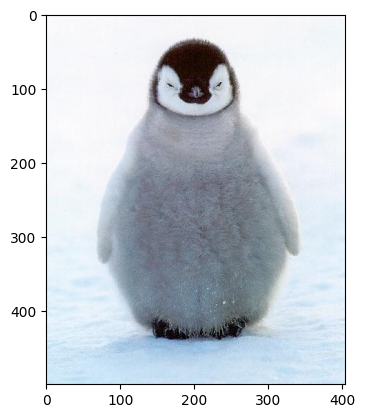

background_img min/max before assignment: 0.0 1.0
object_img min/max: 0.0 1.0
object_mask min/max before assignment: 0 1


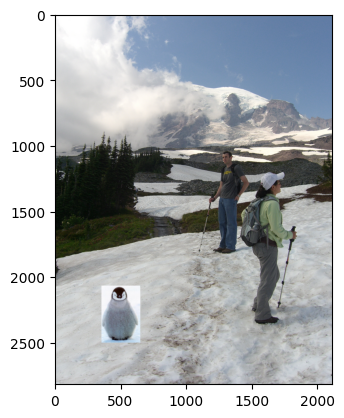

In [551]:
background_img = cv2.cvtColor(cv2.imread('samples/samples/im2.JPG'), cv2.COLOR_BGR2RGB).astype('double') / 255.0
plt.figure()
plt.imshow(background_img)
plt.show()
object_img = cv2.cvtColor(cv2.imread('samples/samples/penguin-chick.jpeg'), cv2.COLOR_BGR2RGB).astype('double') / 255.0
plt.imshow(object_img)
plt.show()

use_interface = False  # set to true if you want to use the interface to choose points (might not work in Colab)
if not use_interface:
  xs = (65, 359, 359, 65)
  ys = (24, 24, 457, 457)
  object_mask = utils.get_mask(ys, xs, object_img)
  bottom_center = (500, 2500) # (x,y)

  object_img, object_mask = utils.crop_object_img(object_img, object_mask)
  bg_ul = utils.upper_left_background_rc(object_mask, bottom_center)
  print("background_img min/max before assignment:", np.min(background_img), np.max(background_img))
  print("object_img min/max:", np.min(object_img), np.max(object_img))
  print("object_mask min/max before assignment:", np.min(object_mask), np.max(object_mask))
  plt.imshow(utils.get_combined_img(background_img, object_img, object_mask, bg_ul))



In [7]:
# if use_interface:
#   import matplotlib.pyplot as plt
#   %matplotlib notebook
#   mask_coords = utils.specify_mask(object_img)

In [8]:
# if use_interface:
#   xs = mask_coords[0]
#   ys = mask_coords[1]
#   %matplotlib inline
#   import matplotlib.pyplot as plt
#   plt.figure()
#   object_mask = utils.get_mask(ys, xs, object_img)

In [9]:
# if use_interface:
#   %matplotlib notebook
#   import matplotlib.pyplot as plt
#   bottom_center = specify_bottom_center(background_img)
#   %matplotlib inline
#   import matplotlib.pyplot as plt

#   object_img, object_mask = utils.crop_object_img(object_img, object_mask)
#   bg_ul = utils.upper_left_background_rc(object_mask, bottom_center)
#   plt.imshow(utils.get_combined_img(background_img, object_img, object_mask, bg_ul))



## Part 2 Poisson Blending (50 pts)

In [541]:
import cv2
import numpy as np
from scipy.sparse import lil_matrix, csr_matrix
from scipy.sparse.linalg import spsolve

def poisson_blend(object_img, object_mask, bg_img, bg_ul):
    """
    Returns a Poisson blended image with masked object_img over the bg_img at position specified by bg_ul.
    Can be implemented to operate on a single channel or multiple channels
    :param object_img: the image containing the foreground object
    :param object_mask: the mask of the foreground object in object_img
    :param background_img: the background image
    :param bg_ul: position (row, col) in background image corresponding to (0,0) of object_img
    """
    #TO DO

    # Extract the patch from the background image where the object should be placed
    bg_row, bg_col = bg_ul
    height, width = object_img.shape[:2]
    bg_patch = bg_img[bg_row:bg_row + height, bg_col:bg_col + width]

    bg_patch = bg_patch.astype(np.float32)
    object_img = object_img.astype(np.float32)
    object_mask = object_mask.astype(np.uint8)

    if object_mask.ndim == 3:
        object_mask = object_mask[:, :, 0]

    # Create a mapping for pixels in the object_mask to a linear index set
    var_index = np.full(object_mask.shape, -1, dtype=int)
    var_index[object_mask > 0] = np.arange(np.sum(object_mask > 0))

    num_vars = np.sum(object_mask > 0)

    # Initialize sparse matrix `A` and `b` vector
    A = lil_matrix((num_vars, num_vars))
    b = np.zeros(num_vars)

    # Iterate through pixels within the object mask
    for y in range(height):
        for x in range(width):
            if object_mask[y, x] == 0:
                continue

            current_var = var_index[y, x]

            # Initial diagonal entry for the current pixel variable
            A_unique = []

            # Handle each neighbor (left, right, up, down)
            neighbors = [(y, x - 1), (y, x + 1), (y - 1, x), (y + 1, x)]
            for ny, nx in neighbors:
                if 0 <= ny < height and 0 <= nx < width:
                    if object_mask[ny, nx] > 0:
                        neighbor_var = var_index[ny, nx]
                        A[current_var, current_var] += 1
                        A_unique.append(neighbor_var)
                        b[current_var] += object_img[y, x] - object_img[ny, nx]
                    else:
                        A[current_var, current_var] += 1
                        b[current_var] += bg_patch[ny, nx]
                else:
                    # If the neighbor is outside the bounds of object_img, use the background patch's pixel value
                    if nx < 0 or nx >= width:
                        nx = min(max(nx, 0), width - 1)
                    if ny < 0 or ny >= height:
                        ny = min(max(ny, 0), height - 1)
                    A[current_var, current_var] += 1
                    b[current_var] += bg_patch[ny, nx]
            
            # Remove duplicates in A_unique if necessary and set off-diagonal entries once
            # A_unique should usually only contain up to 4 unique entries (left, right, up,and down)
            for neighbor_var in set(A_unique):
                A[current_var, neighbor_var] = A[current_var, neighbor_var] if A[current_var, neighbor_var] != 0 else -1

    # Convert to CSR format for efficient solving
    A = A.tocsr()

    # Solve the linear system
    v = spsolve(A, b)

    # Paste the solution back into the blended_patch
    blended_patch = bg_patch.copy()
    blended_patch[object_mask > 0] = v
        
    # Create the resulting image
    background_blended = bg_img.copy()
    background_blended[bg_row:bg_row + height, bg_col:bg_col + width] = blended_patch

    return background_blended


(436, 297, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.19804789125919342..1.0].


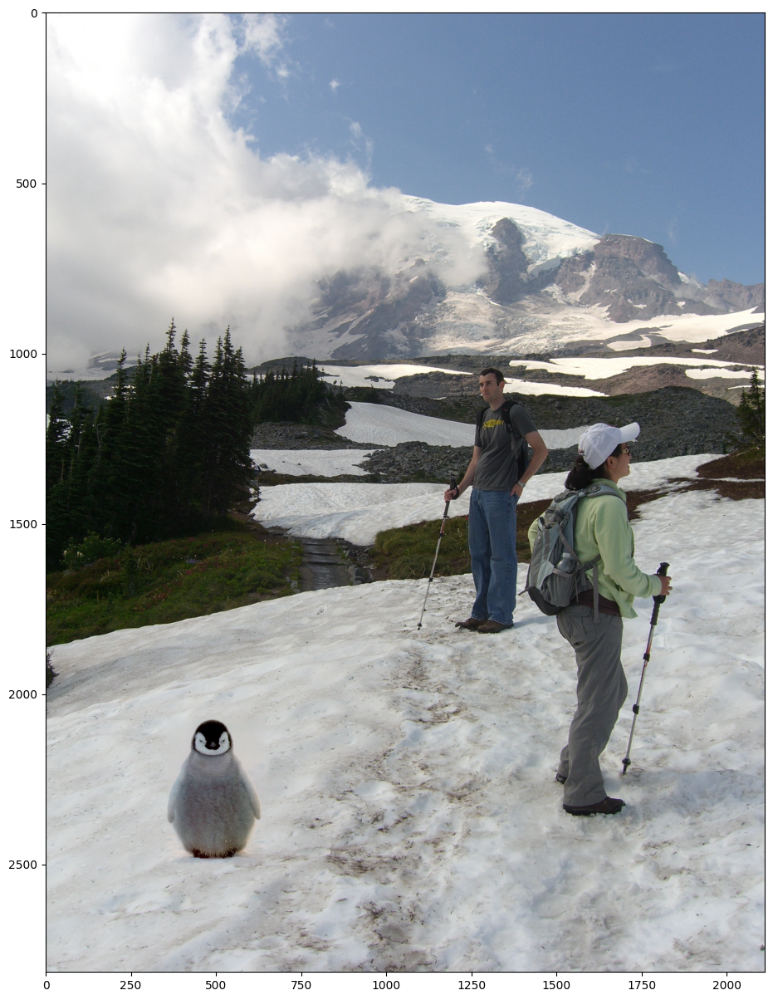

In [542]:
print(object_img.shape)
im_blend = np.zeros(background_img.shape)
for b in np.arange(3):
  im_blend[:,:,b] = poisson_blend(object_img[:,:,b], object_mask, background_img[:,:,b].copy(), bg_ul)

plt.figure(figsize=(15,15))
plt.imshow(im_blend)

In [547]:
import cv2
import numpy as np
import matplotlib.pyplot as plt


def create_mask(object_img):
    # Create a blank black mask
    object_mask = np.zeros((object_img.shape[0], object_img.shape[1]), dtype=np.uint8)

    # Global variables for drawing
    drawing = False  # Flag to indicate drawing
    prev_point = None  # Store previous point

    halved_uint8 = (object_img * 255).astype(np.uint8)

    # Make drawing function use nonlocal variables
    def draw_mask(event, x, y, flags, param):
        nonlocal drawing, prev_point, object_mask  # Make sure these are modified

        if event == cv2.EVENT_LBUTTONDOWN:  # Start drawing
            drawing = True
            prev_point = (x, y)

        elif event == cv2.EVENT_MOUSEMOVE:  # Draw when mouse moves
            if drawing:
                cv2.line(object_mask, prev_point, (x, y), 255, thickness=5)
                prev_point = (x, y)

        elif event == cv2.EVENT_LBUTTONUP:  # Stop drawing
            drawing = False

    # Create a window and set mouse callback
    cv2.namedWindow("Draw Mask")
    cv2.setMouseCallback("Draw Mask", draw_mask)

    while True:
        # Show the image with the mask overlay
        display_img = halved_uint8.copy()
        display_img[object_mask > 0] = [0, 255, 0]  # Overlay green mask

        cv2.imshow("Draw Mask", display_img)

        key = cv2.waitKey(1) & 0xFF
        if key == ord('f'):  # Fill enclosed shape (press f to fill)
            contours, _ = cv2.findContours(object_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
            if contours:
                cv2.drawContours(object_mask, contours, -1, 255, thickness=cv2.FILLED)  # Fill inside

        elif key == ord('r'):  # Reset the mask
            object_mask[:] = 0  # Corrected: Modify in-place instead of redefining

        elif key == ord('s'):  # Save and exit
            break

    cv2.destroyAllWindows()

    # Show the final mask in matplotlib
    plt.imshow(object_mask, cmap='gray')
    plt.title("Final Hand-Drawn Mask (Filled)")
    plt.show()

    return object_mask


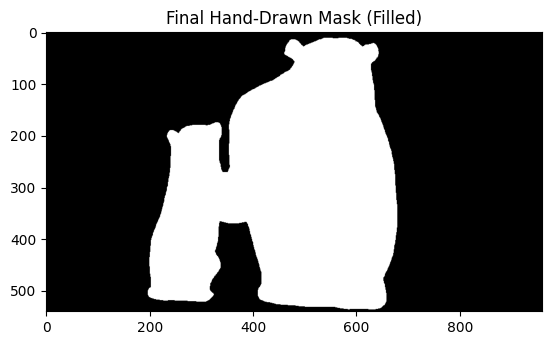

In [564]:
# Load and resize the image
object_img = cv2.cvtColor(cv2.imread('samples/samples/polar_bears.jpg'), cv2.COLOR_BGR2RGB).astype('double') / 255.0
height, width = object_img.shape[:2]
halved_bear_img = cv2.resize(object_img, (width // 2, height // 2))

# # Convert to uint8 for OpenCV functions
# halved_uint8 = (halved_bear_img * 255).astype(np.uint8)

bear_object_mask = create_mask(halved_bear_img)/255.0

## More gradient domain processing (up to 20 pts)

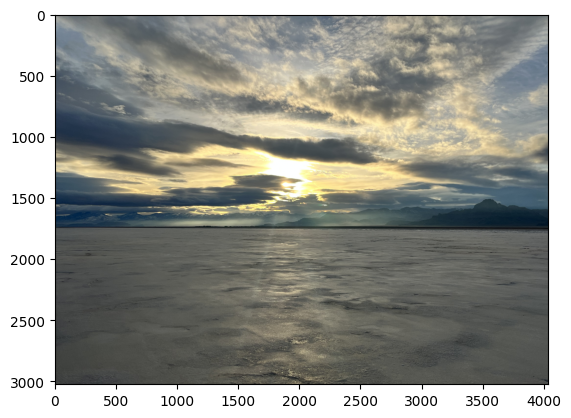

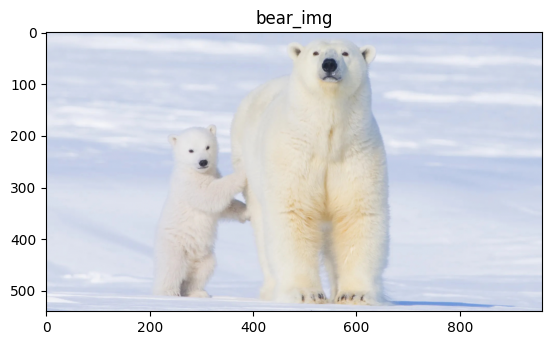

(1080, 1920, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.4292137622833252..1.0].


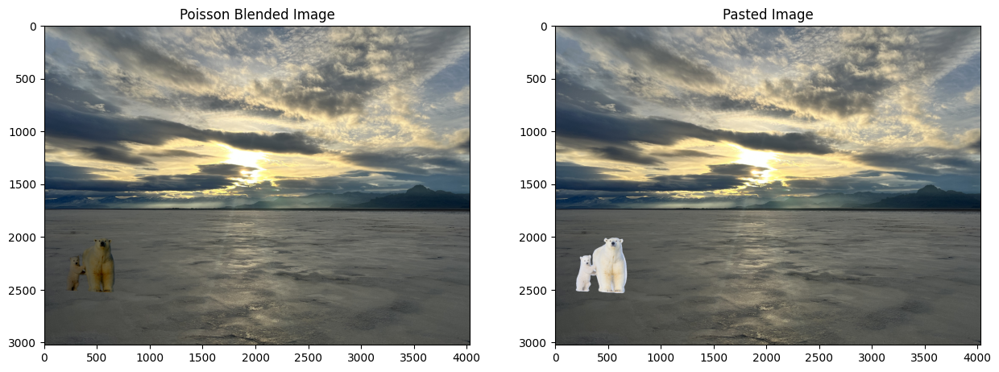

In [565]:
salt_img = cv2.cvtColor(cv2.imread('samples/samples/Salt_Flats.jpg'), cv2.COLOR_BGR2RGB).astype('double') / 255.0
plt.figure()
plt.imshow(salt_img)
plt.show()



height, width = object_img.shape[:2]



plt.imshow(halved_bear_img)
plt.title("bear_img")
plt.show()
height, width = halved_bear_img.shape[:2]



print(object_img.shape)
im_blend = np.zeros(salt_img.shape)
for b in np.arange(3):
  im_blend[:,:,b] = poisson_blend(halved_bear_img[:,:,b], bear_object_mask, salt_img[:,:,b].copy(), [2000,0])



result_img = utils.get_combined_img(salt_img, halved_bear_img, bear_object_mask, [2000,0])
result_img = np.clip(result_img, 0, 1)  # Ensure all values are between 0 and 1


plt.figure(figsize=(15, 7))  # Create a wider figure

# Show im_blend
plt.subplot(1, 2, 1)  # 1 row, 2 columns, first subplot
plt.imshow(im_blend)
plt.title("Poisson Blended Image")


# Show result_img
plt.subplot(1, 2, 2)  # 1 row, 2 columns, second subplot
plt.imshow(result_img)
plt.title("Pasted Image")

plt.show()  # Display both images



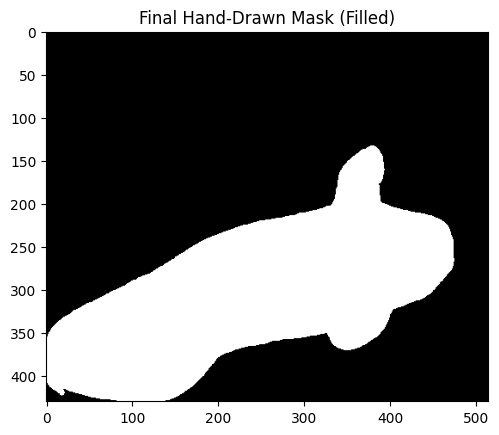

In [569]:
# Load the image (full size)
fish_img = cv2.cvtColor(cv2.imread('samples/samples/fish.png'), cv2.COLOR_BGR2RGB).astype('double') / 255.0

fish_mask = create_mask(fish_img)/255.0


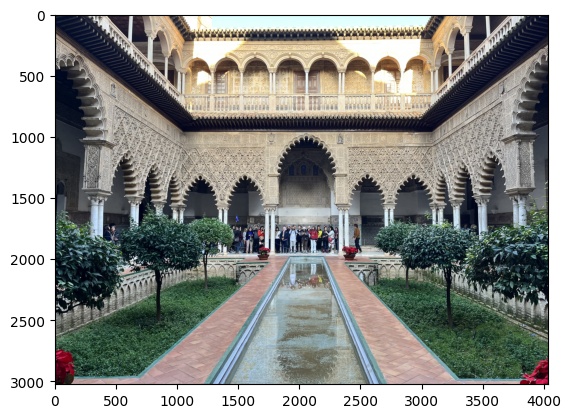

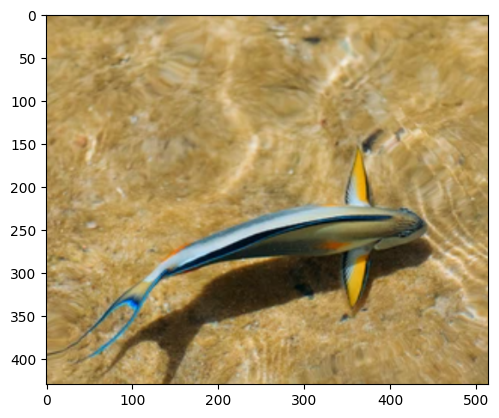

(1080, 1920, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.24787387251853943..1.3335679769515991].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.24787387251853943..1.3335679769515991].


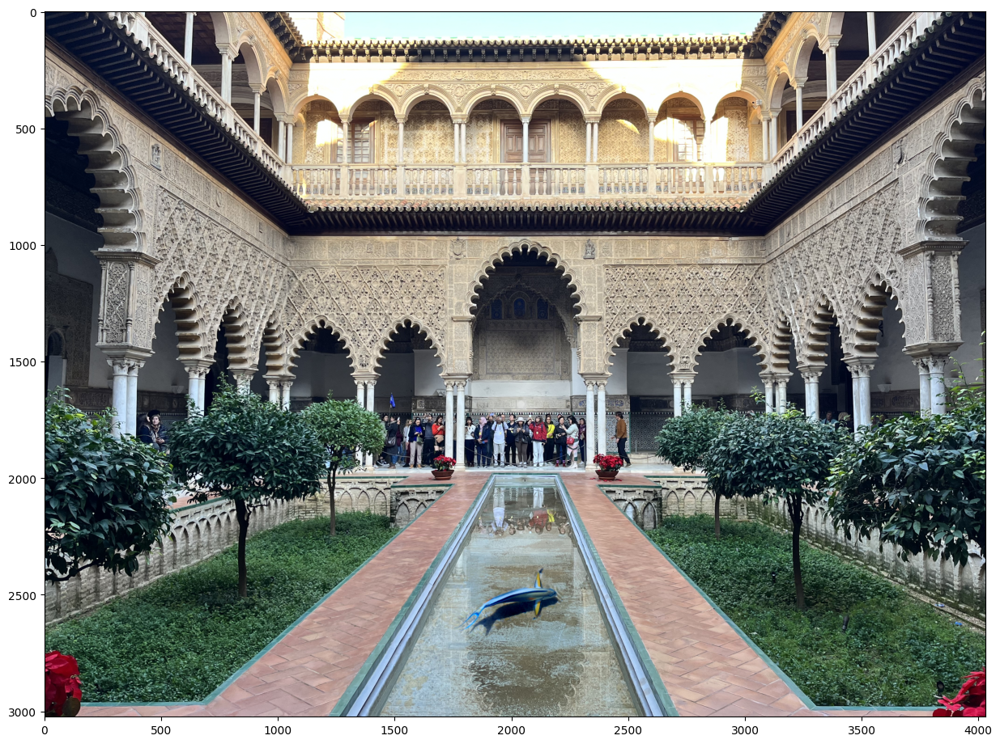

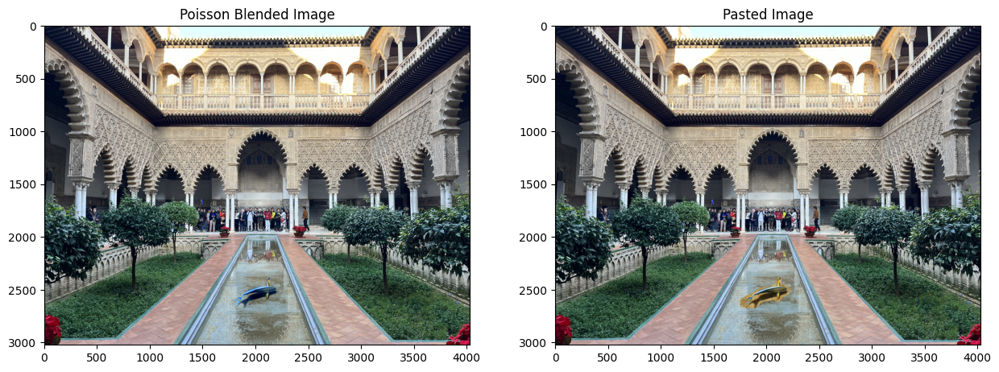

In [572]:
alhambra_img = cv2.cvtColor(cv2.imread('samples/samples/alhambra.jpg'), cv2.COLOR_BGR2RGB).astype('double') / 255.0
plt.figure()
plt.imshow(alhambra_img)
plt.show()


height, width = fish_img.shape[:2]


plt.imshow(fish_img)
plt.show()



print(object_img.shape)
im_blend = np.zeros(alhambra_img.shape)
for b in np.arange(3):
  im_blend[:,:,b] = poisson_blend(fish_img[:,:,b], fish_mask, alhambra_img[:,:,b].copy(), [2250,1750])
plt.figure(figsize=(15,15))
plt.imshow(im_blend)


result_img = utils.get_combined_img(alhambra_img, fish_img, fish_mask, [2250,1750])
result_img = np.clip(result_img, 0, 1)  # Ensure all values are between 0 and 1


plt.figure(figsize=(15, 7))  # Create a wider figure

# Show im_blend
plt.subplot(1, 2, 1)  # 1 row, 2 columns, first subplot
plt.imshow(im_blend)
plt.title("Poisson Blended Image")


# Show result_img
plt.subplot(1, 2, 2)  # 1 row, 2 columns, second subplot
plt.imshow(result_img)
plt.title("Pasted Image")

plt.show()  # Display both images


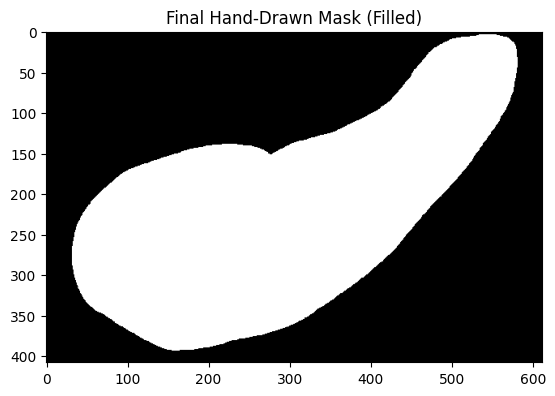

In [573]:

# Load the image (full size)
koi_img = cv2.cvtColor(cv2.imread('samples/samples/Koi_Fish.jpg'), cv2.COLOR_BGR2RGB).astype('double') / 255.0


koi_mask = create_mask(koi_img)/255.0


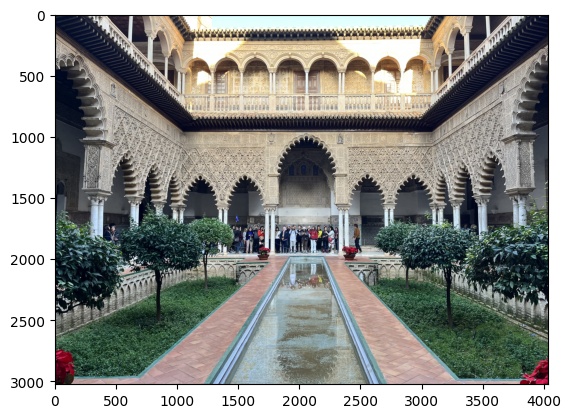

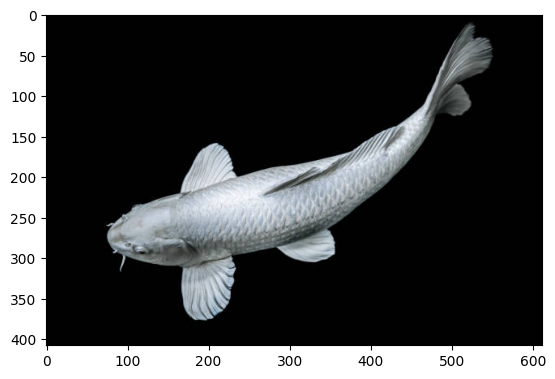

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.601363182067871].


<Figure size 1500x1500 with 0 Axes>

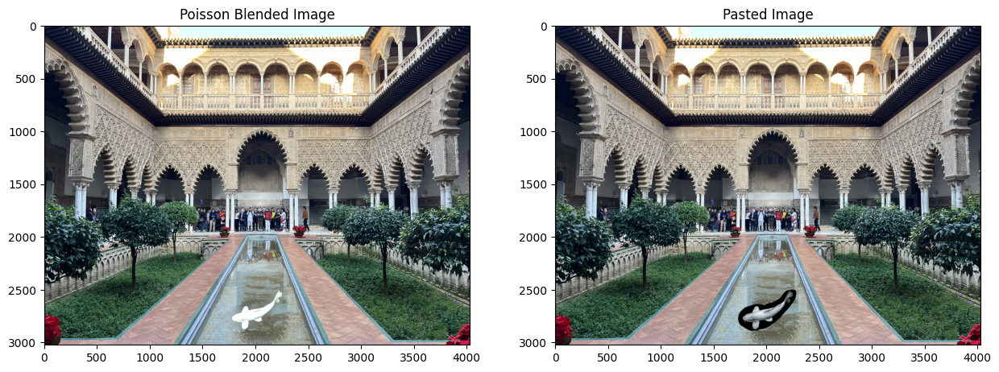

In [577]:
plt.figure()
plt.imshow(alhambra_img)
plt.show()



plt.imshow(koi_img)
plt.show()


im_blend = np.zeros(alhambra_img.shape)
for b in np.arange(3):
  im_blend[:,:,b] = poisson_blend(koi_img[:,:,b], koi_mask, alhambra_img[:,:,b].copy(), [2500,1700])
plt.figure(figsize=(15,15))


result_img = utils.get_combined_img(alhambra_img, koi_img, koi_mask, [2500,1700])
result_img = np.clip(result_img, 0, 1)  # Ensure all values are between 0 and 1


plt.figure(figsize=(15, 7))  # Create a wider figure

# Show im_blend
plt.subplot(1, 2, 1)  # 1 row, 2 columns, first subplot
plt.imshow(im_blend)
plt.title("Poisson Blended Image")


# Show result_img
plt.subplot(1, 2, 2)  # 1 row, 2 columns, second subplot
plt.imshow(result_img)
plt.title("Pasted Image")

plt.show()  # Display both images


## Part 3 Mixed Gradients (20 pts)

In [175]:
def mixed_blend(object_img, object_mask, bg_img, bg_ul):
    """
    Returns a mixed gradient blended image with masked object_img over the bg_img at position specified by bg_ul.
    Can be implemented to operate on a single channel or multiple channels
    :param object_img: the image containing the foreground object
    :param object_mask: the mask of the foreground object in object_img
    :param background_img: the background image
    :param bg_ul: position (row, col) in background image corresponding to (0,0) of object_img
    """
    #TO DO

    # Extract the patch from the background image where the object should be placed
    bg_row, bg_col = bg_ul
    height, width = object_img.shape[:2]
    bg_patch = bg_img[bg_row:bg_row + height, bg_col:bg_col + width]

    bg_patch = bg_patch.astype(np.float32)
    object_img = object_img.astype(np.float32)
    object_mask = object_mask.astype(np.uint8)

    if object_mask.ndim == 3:
        object_mask = object_mask[:, :, 0]

    # Create a mapping for pixels in the object_mask to a linear index set
    var_index = np.full(object_mask.shape, -1, dtype=int)
    var_index[object_mask > 0] = np.arange(np.sum(object_mask > 0))

    num_vars = np.sum(object_mask > 0)

    # Initialize sparse matrix `A` and `b` vector
    A = lil_matrix((num_vars, num_vars))
    b = np.zeros(num_vars)

    # Iterate through pixels within the object mask
    for y in range(height):
        for x in range(width):
            if object_mask[y, x] == 0:
                continue

            current_var = var_index[y, x]

            # Initial diagonal entry for the current pixel variable
            A_unique = []

            # Handle each neighbor (left, right, up, down)
            neighbors = [(y, x - 1), (y, x + 1), (y - 1, x), (y + 1, x)]
            for ny, nx in neighbors:
                if 0 <= ny < height and 0 <= nx < width:
                    if object_mask[ny, nx] > 0:
                        neighbor_var = var_index[ny, nx]
                        A[current_var, current_var] += 1
                        A_unique.append(neighbor_var)

                        #Check if source or target has larger magnitude
                        if abs(bg_patch[y, x] - bg_patch[ny, nx]) > abs(object_img[y, x] - object_img[ny, nx]):
                          b[current_var] += bg_patch[y, x] - bg_patch[ny, nx]
                        else:
                          b[current_var] += object_img[y, x] - object_img[ny, nx]

                    else:
                        A[current_var, current_var] += 1

                        #Check if source or target has larger magnitude
                        if abs(bg_patch[y, x] - bg_patch[ny, nx]) > abs(object_img[y, x] - object_img[ny, nx]):
                          b[current_var] += bg_patch[y, x] - bg_patch[ny, nx] + bg_patch[ny, nx]
                        else:
                          b[current_var] += object_img[y, x] - object_img[ny, nx] + bg_patch[ny, nx]

                else:
                    # If the neighbor is outside the bounds of object_img, use the background patch's pixel value
                    if nx < 0 or nx >= width:
                        nx = min(max(nx, 0), width - 1)
                    if ny < 0 or ny >= height:
                        ny = min(max(ny, 0), height - 1)
                    A[current_var, current_var] += 1
                    b[current_var] += bg_patch[ny, nx]

            # Remove duplicates in A_unique if necessary and set off-diagonal entries once
            # A_unique should usually only contain up to 4 unique entries (left, right, up,and down)
            for neighbor_var in set(A_unique):
                A[current_var, neighbor_var] = A[current_var, neighbor_var] if A[current_var, neighbor_var] != 0 else -1

    # Convert to CSR format for efficient solving
    A = A.tocsr()

    # Solve the linear system
    v = spsolve(A, b)

    # Paste the solution back into the blended_patch
    blended_patch = bg_patch.copy()
    blended_patch[object_mask > 0] = v

    # Create the resulting image
    background_blended = bg_img.copy()
    background_blended[bg_row:bg_row + height, bg_col:bg_col + width] = blended_patch

    return background_blended

Resized car_img shape: (266, 189, 3)
Resized parking_img shape: (274, 414, 3)


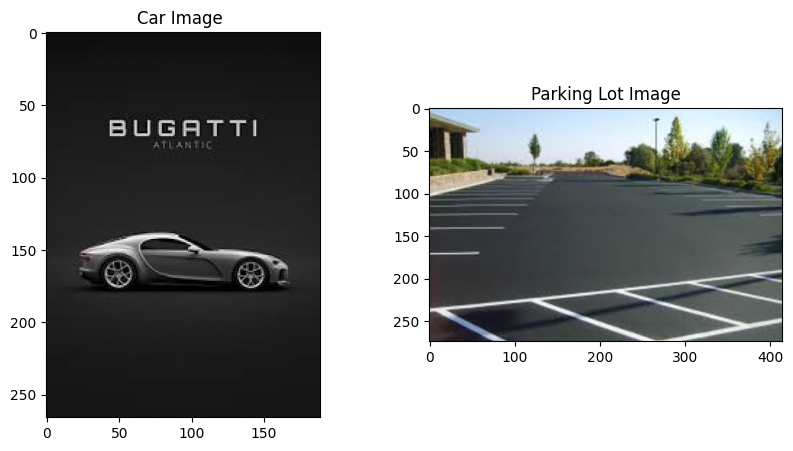

In [578]:
# Load the image (full size)
car_img = cv2.cvtColor(cv2.imread('samples/samples/car2.jpg'), cv2.COLOR_BGR2RGB).astype('double') / 255
# Load the image (full size)
parking_img = cv2.cvtColor(cv2.imread('samples/samples/parking_lot.jpg'), cv2.COLOR_BGR2RGB).astype('double') / 255

scale_factor_car = 1  # Reduce car image to 10x smaller
scale_factor_parking = 1.5  # Increase parking lot image to 10x larger

# Resize the car image
car_img = cv2.resize(car_img, (0, 0), fx=scale_factor_car, fy=scale_factor_car)

# Resize the parking lot image
parking_img = cv2.resize(parking_img, (0, 0), fx=scale_factor_parking, fy=scale_factor_parking)

print("Resized car_img shape:", car_img.shape)
print("Resized parking_img shape:", parking_img.shape)

# Display images
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(car_img)
plt.title("Car Image ")

plt.subplot(1, 2, 2)
plt.imshow(parking_img)
plt.title("Parking Lot Image")

plt.show()

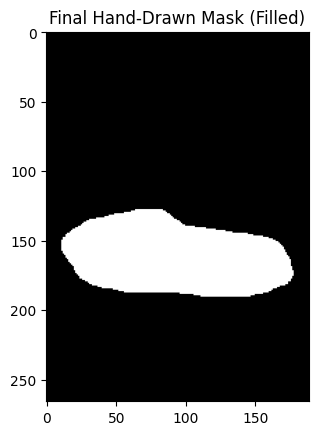

In [579]:
import cv2
import numpy as np
import matplotlib.pyplot as plt


car_mask1 = create_mask(car_img)
car_mask1 = car_mask1/255

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.1430878639221191].


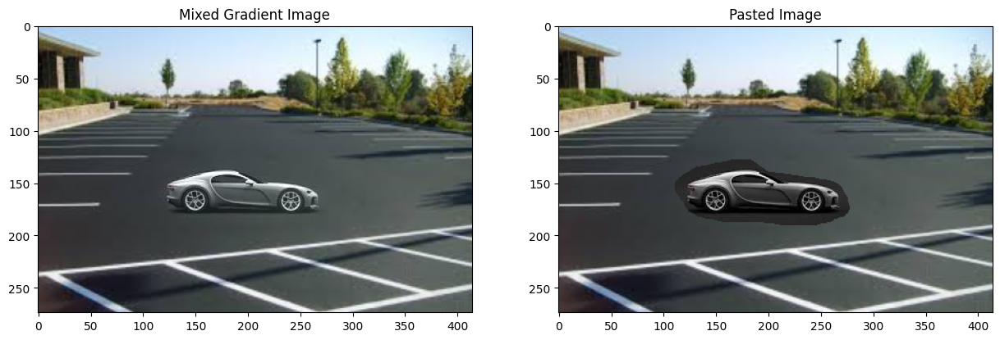

In [581]:
im_mix3 = np.zeros(parking_img.shape)

for b in range(3):
    im_mix3[:, :, b] = mixed_blend(car_img[:, :, b], car_mask1, parking_img[:, :, b], [0, 100])



result_img = utils.get_combined_img(parking_img, car_img, car_mask1, [0, 100])
result_img = np.clip(result_img, 0, 1)  # Ensure all values are between 0 and 1


plt.figure(figsize=(15, 7))  # Create a wider figure

# Show im_blend
plt.subplot(1, 2, 1)  # 1 row, 2 columns, first subplot
plt.imshow(im_mix3)
plt.title("Mixed Gradient Image")


# Show result_img
plt.subplot(1, 2, 2)  # 1 row, 2 columns, second subplot
plt.imshow(result_img)
plt.title("Pasted Image")

plt.show()  # Display both images



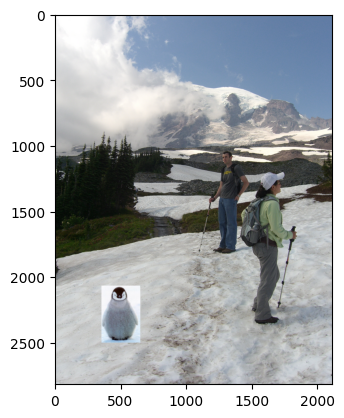

In [272]:
background_img = cv2.cvtColor(cv2.imread('samples/samples/im2.JPG'), cv2.COLOR_BGR2RGB).astype('double') / 255.0

object_img = cv2.cvtColor(cv2.imread('samples/samples/penguin-chick.jpeg'), cv2.COLOR_BGR2RGB).astype('double') / 255.0

use_interface = False  # set to true if you want to use the interface to choose points (might not work in Colab)
if not use_interface:
  xs = (65, 359, 359, 65)
  ys = (24, 24, 457, 457)
  object_mask = utils.get_mask(ys, xs, object_img)
  bottom_center = (500, 2500) # (x,y)

  object_img, object_mask = utils.crop_object_img(object_img, object_mask)
  bg_ul = utils.upper_left_background_rc(object_mask, bottom_center)
  plt.imshow(utils.get_combined_img(background_img, object_img, object_mask, bg_ul))

(436, 297)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.2901758849620819..1.0].


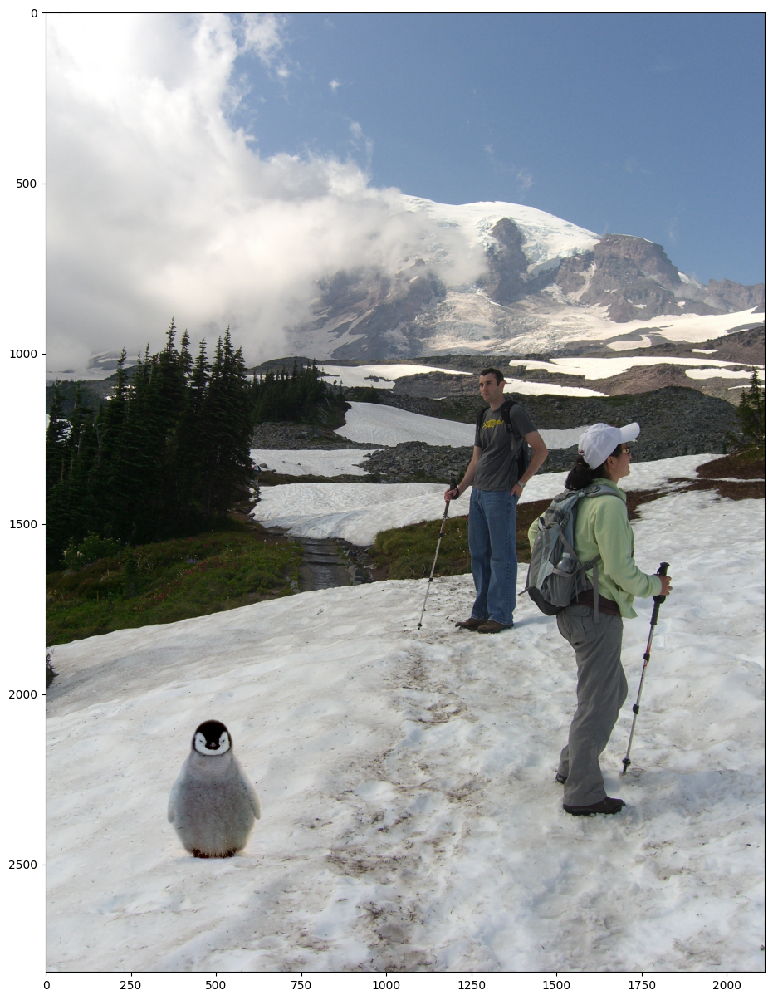

In [ ]:
im_mix = np.zeros(background_img.shape)
print(object_mask.shape)

for b in np.arange(3):
  im_mix[:,:,b] = mixed_blend(object_img[:,:,b], object_mask, background_img[:,:,b].copy(), bg_ul)

plt.figure(figsize=(15,15))
plt.imshow(im_mix)

# Bells & Whistles (Extra Points)

## Color2Gray (20 pts)

## Laplacian pyramid blending (20 pts)

In [582]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import signal
from PIL import Image

# def get_gaussian_kernel(kernel_size, sigma):

#     ax = np.arange(-(kernel_size // 2), (kernel_size // 2) + 1)
#     xx, yy = np.meshgrid(ax, ax)
#     kernel = np.exp(-(xx**2 + yy**2) / (2 * sigma**2))
#     kernel = kernel / np.sum(kernel)  # Normalize the kernel
#     return kernel


def gaussian_pyramid(image, depth):
    gaussian_pyramid = [image]
    
    for i in range(1, depth):
        gaussian_pyramid.append(cv2.pyrDown(gaussian_pyramid[i - 1]))  # Downsample using OpenCV
    
    return gaussian_pyramid

def expand(image):

    expanded = cv2.pyrUp(image)
    expanded = cv2.resize(expanded, (image.shape[1] * 2, image.shape[0] * 2))  # Ensure correct size
    return expanded

def laplacian_pyramid(image, depth):

    G = gaussian_pyramid(image, depth)
    lp = [G[-1]]  # Last level of Gaussian pyramid is added as is

    for i in range(depth - 1, 0, -1):
        expanded = cv2.pyrUp(G[i])  # Expand the smaller level
        expanded = cv2.resize(expanded, (G[i - 1].shape[1], G[i - 1].shape[0]))  # Resize to match
        lp.append(G[i - 1] - expanded)  # Laplacian level

    return lp[::-1]  # Reverse the list to maintain order

def combine(LA, LB, GR):
    depth = len(LA)
    LS = np.empty((depth), dtype=object)
    
    for d in range(depth):
        LS[d] = GR[d] * LA[d] + (1 - GR[d]) * LB[d]
    
    return LS

def collapse(laplacian_pyramid, depth):
    G = [None] * depth
    G[-1] = laplacian_pyramid[-1]

    for i in range(2, depth + 1):
        expanded = expand(G[-i + 1])
        
        # Ensure expanded size matches the corresponding Laplacian level
        if expanded.shape != laplacian_pyramid[-i].shape:
            expanded = expanded[:laplacian_pyramid[-i].shape[0], :laplacian_pyramid[-i].shape[1]]

        G[-i] = laplacian_pyramid[-i] + expanded

    I = G[0]
    return I



In [680]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import signal
from PIL import Image

# Assuming your functions like `laplacian_pyramid`, `gaussian_pyramid`, `expand`, etc. are defined as before

def blend_images(image1, image2, mask, depth=5):
    image1 = np.clip(image1, 0, 1)
    image2 = np.clip(image2, 0, 1)

    image1 = image1*255
    image2 = image2*255

    image1 = image1.astype(np.float32)
    image2 = image2.astype(np.float32)
    mask = mask.astype(np.float32)
    

    # Step 1: Build Laplacian pyramids for both images
    L1 = laplacian_pyramid(image1, depth)
    L2 = laplacian_pyramid(image2, depth)

    # Step 2: Build the Gaussian pyramid for the mask
    mask = cv2.GaussianBlur(mask, (15, 15), 5)  # Adjust kernel size (15,15) for smoother blending
    G_mask = gaussian_pyramid(mask, depth)

    # Step 3: Combine the Laplacian pyramids using the Gaussian pyramid
    LS_combined = combine(L1, L2, G_mask)

    # Step 4: Collapse the combined Laplacian pyramid to get the final blended image
    blended_image = collapse(LS_combined, depth).astype(np.uint8)
    
    return blended_image

# # Load the images (example using orange and apple)
# image1 = np.array(Image.open('orange.png'))
# image2 = np.array(Image.open('apple.png'))

# # Create a mask (for example, a simple binary mask)
# mask = np.zeros_like(image1[:, :, 0])  # Assuming the images are RGB
# mask[:, image1.shape[1]//2:] = 1  # Example: Blend right half of image1 with image2
# Get shark image dimensions



Resized car_img shape: (1600, 2400, 3)
Resized parking_img shape: (1830, 2760, 3)


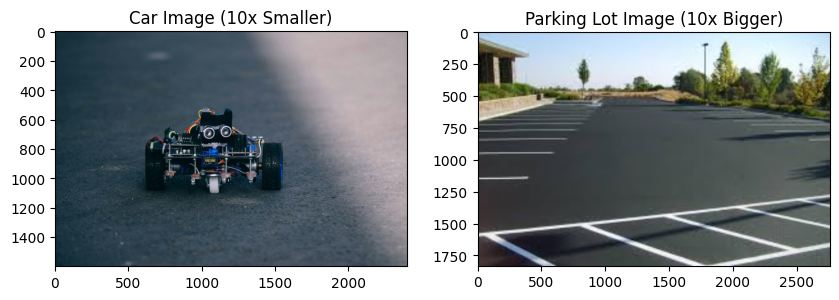

In [702]:
# Load the image (full size)
car_img = cv2.cvtColor(cv2.imread('samples/samples/car.jpg'), cv2.COLOR_BGR2RGB).astype('double') / 255
# Load the image (full size)
parking_img = cv2.cvtColor(cv2.imread('samples/samples/parking_lot.jpg'), cv2.COLOR_BGR2RGB).astype('double') / 255

scale_factor_car = .8  # Reduce car image to 10x smaller
scale_factor_parking = 10  # Increase parking lot image to 10x larger

# Resize the car image
car_img = cv2.resize(car_img, (0, 0), fx=scale_factor_car, fy=scale_factor_car)

# Resize the parking lot image
parking_img = cv2.resize(parking_img, (0, 0), fx=scale_factor_parking, fy=scale_factor_parking)

print("Resized car_img shape:", car_img.shape)
print("Resized parking_img shape:", parking_img.shape)

# Display images
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(car_img)
plt.title("Car Image (10x Smaller)")

plt.subplot(1, 2, 2)
plt.imshow(parking_img)
plt.title("Parking Lot Image (10x Bigger)")

plt.show()


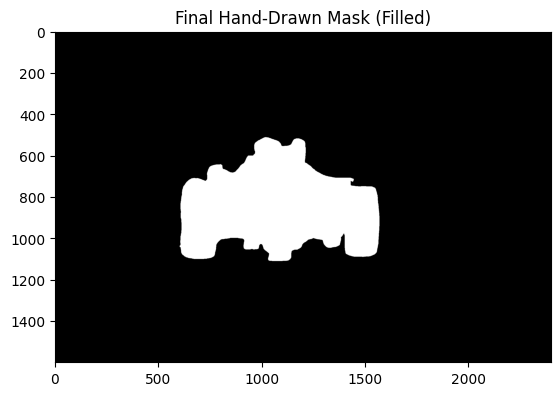

In [697]:
car_mask = create_mask(car_img)
car_mask = car_mask/255

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.1999264705882353].


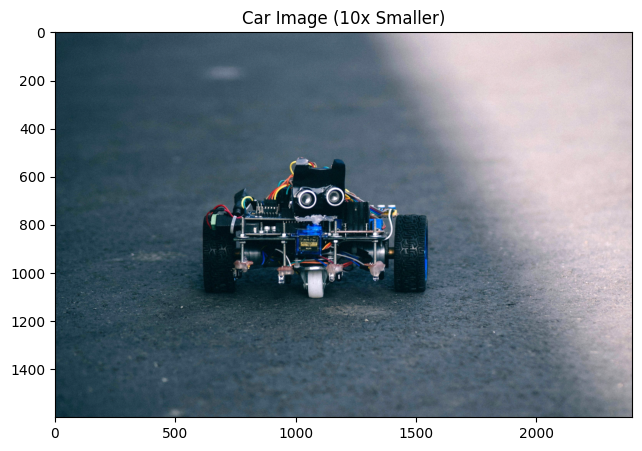

In [703]:
car_img= car_img*1.2

plt.figure(figsize=(10, 5))

plt.imshow(car_img)
plt.title("Car Image (10x Smaller)")
plt.show()

Car Image Shape: (1600, 2400, 3)
Parking Image Shape: (1830, 2760, 3)
Car Mask Shape: (1600, 2400)


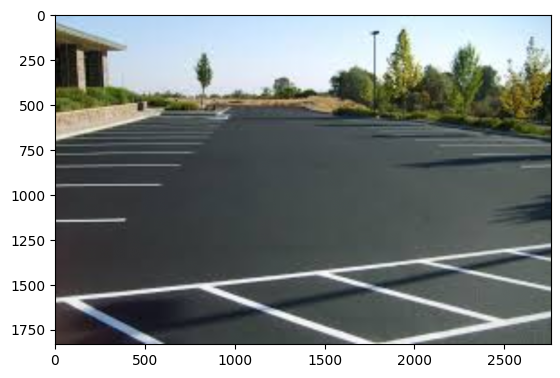

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.1999264705882353].


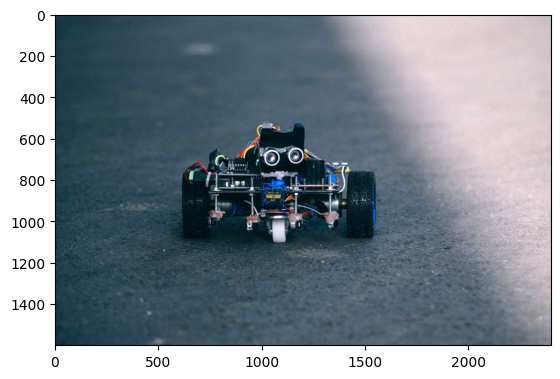

Mask min/max: 0.0 1.0


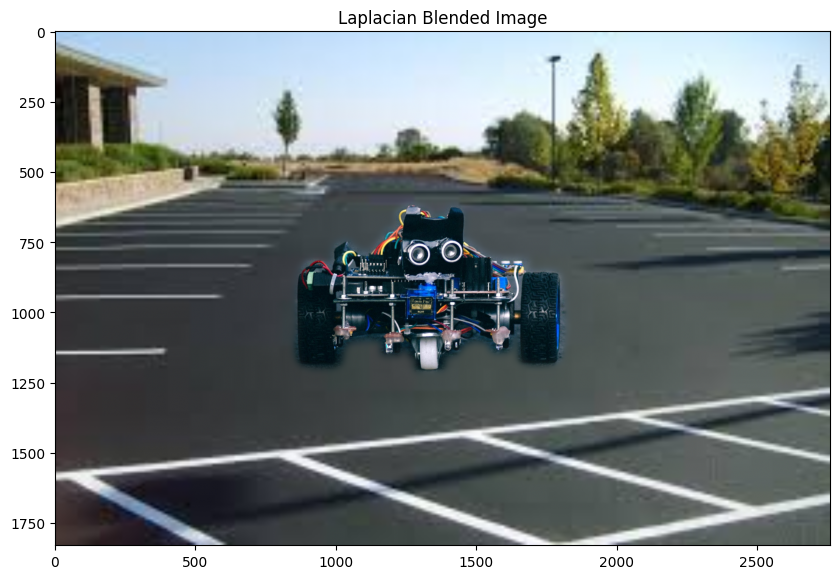

In [715]:
# Print image shapes
print("Car Image Shape:", car_img.shape)
print("Parking Image Shape:", parking_img.shape)
print("Car Mask Shape:", car_mask.shape)

plt.figure()
plt.imshow(parking_img)
plt.show()

plt.imshow(car_img)
plt.show()

# Get car image dimensions
car_h, car_w = car_img.shape[:2]

# Define top-left corner of the blend region in parking_img
start_y, start_x = 100, 250

# Extract the correct portion from parking_img
parking_crop = parking_img[start_y:start_y + car_h, start_x:start_x + car_w]

# Ensure the extracted part matches car_img
assert parking_crop.shape[:2] == car_img.shape[:2], "Cropped parking image size does not match car image size!"

# Ensure mask is the same shape
assert car_mask.shape[:2] == car_img.shape[:2], "Car mask size does not match car image size!"

# Initialize the blended image
im_blend = np.zeros_like(car_img, dtype=np.float32)


# Blend each color channel separately
for b in range(3):
    im_blend[:, :, b] = blend_images(car_img[:, :, b], parking_crop[:, :, b], car_mask)

# Convert the blended image back to uint8 and clip values to [0, 255]
im_blend = np.clip(im_blend, 0, 255).astype(np.uint8)

# Create a copy of parking_img to preserve the original
parking_copy = parking_img.copy()

print("Mask min/max:", np.min(car_mask), np.max(car_mask))

# Reverse the car_mask to use for the blending area
reversed_car_mask = 1 - car_mask

# plt.imshow(reversed_car_mask, cmap='gray')
# plt.title("reversed_car_mask")
# plt.show()

# plt.figure(figsize=(10, 10))
# plt.imshow(im_blend)
# plt.show()

# Ensure the blended patch is properly clamped
im_blend = np.clip(im_blend, 0, 255).astype(np.uint8)

# Apply the blended patch to parking_copy
laplacian_blend = parking_img.copy()

laplacian_blend[start_y:start_y + car_h, start_x:start_x + car_w] = im_blend/255.0

plt.figure(figsize=(10, 10))
plt.imshow(laplacian_blend)
plt.title("Laplacian Blended Image")
plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.13038823008537292..1.3635315895080566].


<Figure size 1500x1500 with 0 Axes>

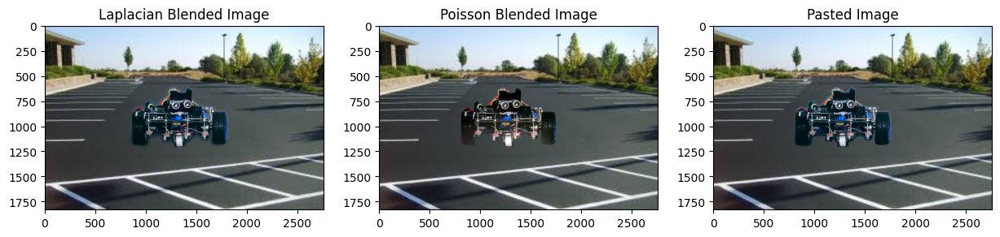

In [ ]:
im_blend5 = np.zeros(parking_img.shape)
for b in np.arange(3):
  im_blend5[:,:,b] = poisson_blend(car_img[:,:,b], car_mask, parking_img[:,:,b].copy(), [100,200])
plt.figure(figsize=(15,15))


paste2 = utils.get_combined_img(parking_img, car_img, car_mask, [100,200])
paste2 = np.clip(paste2, 0, 1)  # Ensure all values are between 0 and 1


# Plotting
plt.figure(figsize=(15, 7))  # Create a wider figure

# Show im_blend (already Laplacian blended image)
plt.subplot(1, 3, 1)  # 1 row, 3 columns, first subplot
plt.imshow(laplacian_blend)
plt.title("Laplacian Blended Image")

plt.subplot(1, 3, 2)  # 1 row, 2 columns, first subplot
plt.imshow(im_blend5)
plt.title("Poisson Blended Image")
# Show another image (if needed, replace with another image or leave as is)
plt.subplot(1, 3, 3)  # 1 row, 3 columns, third subplot
plt.imshow(paste2)
plt.title("Pasted Image")


plt.show()  # Display all images


## More gradient domain processing (up to 20 pts)